In [1]:
import os
import numpy as np
import cv2
from glob import glob
import imageio
from tqdm import tqdm
import pandas as pd
from datetime import datetime

import tensorflow as tf
from sklearn.utils import shuffle
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, CSVLogger, TensorBoard, EarlyStopping
from tensorflow.keras.metrics import Recall, Precision
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

### **Build U-Net**

In [3]:
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="UNET")
    return model

In [4]:
input_shape = (512, 512, 1)
model = build_unet(input_shape)
model.summary()

Model: "UNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                              

### **Metric**

In [3]:
def iou(y_true, y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)

smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

### **Train**

In [6]:
H = 512
W = 512

def load_data(path, valid_size=0.2, random_state=42):
    """ X = Images and Y = masks """
    train_x = sorted(glob(os.path.join(path, "images", "*.jpg")))
    train_y = sorted(glob(os.path.join(path, "masks", "*.tif")))
    
    # Split the training data into train and validation using train_test_split
    train_x, valid_x, train_y, valid_y = train_test_split(train_x, train_y, test_size=valid_size, random_state=random_state)

    return (train_x, train_y), (valid_x, valid_y)

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

def shuffling(x, y):
    x, y = shuffle(x, y, random_state=42)
    return x, y

def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale
    x = x / 255.0
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)  # Expand dimensions to (512, 512, 1)
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale
    x = x / 255.0
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)  # Expand dimensions to (512, 512, 1)
    return x

def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32])
    x.set_shape([H, W, 1])  # Set input shape to (512, 512, 1)
    y.set_shape([H, W, 1])
    return x, y

def tf_dataset(X, Y, batch_size=2):
    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    dataset = dataset.map(tf_parse)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(4)
    return dataset

In [7]:
""" Seeding """
np.random.seed(42)
tf.random.set_seed(42)

""" Directory to save files """
create_dir("/kaggle/working/result")

""" Hyperparameters """
batch_size = 8
lr = 1e-4
num_epochs = 50

timestamp = datetime.now().strftime("%d%m%Y_%H%M%S")
model_filename = f"model_{timestamp}.h5"
csv_filename = f"data_{timestamp}.csv"

model_path = os.path.join("/kaggle/working/result", model_filename)
csv_path = os.path.join("/kaggle/working/result", csv_filename)


""" Dataset """
train_path = "/kaggle/input/idrid-soft-exudate/train_data"
(train_x, train_y), (valid_x, valid_y) = load_data(train_path)

'''train_x, train_y = load_data(train_path)
train_x, train_y = shuffling(train_x, train_y)
valid_x, valid_y = load_data(valid_path)'''

print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Valid: {len(valid_x)} - {len(valid_y)}")

train_dataset = tf_dataset(train_x, train_y, batch_size=batch_size)
valid_dataset = tf_dataset(valid_x, valid_y, batch_size=batch_size)

train_steps = len(train_x) // batch_size
valid_steps = len(valid_x) // batch_size

if len(train_x) % batch_size != 0:
    train_steps += 1
if len(valid_x) % batch_size != 0:
    valid_steps += 1

""" Model """
model = build_unet((H, W, 1))  # Change input shape to (512, 512, 1)
model.compile(loss=dice_loss, optimizer=Adam(lr), metrics=[dice_coef, iou, Recall(), Precision()])

Train: 2227 - 2227
Valid: 557 - 557


In [8]:
callbacks = [
        ModelCheckpoint(model_path, verbose=1, save_best_only=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=10, min_lr=1e-6, verbose=1),
        CSVLogger(csv_path),
        TensorBoard(),
        EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=False)
    ]

model.fit(
        train_dataset,
        epochs=num_epochs,
        validation_data=valid_dataset,
        steps_per_epoch=train_steps,
        validation_steps=valid_steps,
        callbacks=callbacks
    )

Epoch 1/50
279/279 [==============================] - ETA: 0s - loss: 0.7993 - dice_coef: 0.2011 - iou: 0.1176 - recall: 0.6993 - precision: 0.1920
Epoch 1: val_loss improved from inf to 0.92504, saving model to /kaggle/working/result/model_05102023_132333.h5
279/279 [==============================] - 319s 1s/step - loss: 0.7993 - dice_coef: 0.2011 - iou: 0.1176 - recall: 0.6993 - precision: 0.1920 - val_loss: 0.9250 - val_dice_coef: 0.0747 - val_iou: 0.0398 - val_recall: 0.1225 - val_precision: 0.4525 - lr: 1.0000e-04
Epoch 2/50
279/279 [==============================] - ETA: 0s - loss: 0.6724 - dice_coef: 0.3280 - iou: 0.2074 - recall: 0.6941 - precision: 0.3875
Epoch 2: val_loss improved from 0.92504 to 0.85970, saving model to /kaggle/working/result/model_05102023_132333.h5
279/279 [==============================] - 252s 902ms/step - loss: 0.6724 - dice_coef: 0.3280 - iou: 0.2074 - recall: 0.6941 - precision: 0.3875 - val_loss: 0.8597 - val_dice_coef: 0.1421 - val_iou: 0.0793 - val

### **Evaluation**

In [16]:
from tensorflow.keras.utils import CustomObjectScope
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

H = 512
W = 512

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

def read_image(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    # x = cv2.resize(x, (W, H))
    ori_x = x
    #ori_x = np.expand_dims(x, axis=-1)
    x = x/255.0
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)
    return ori_x, x

def read_mask(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  ## (512, 512)
    # x = cv2.resize(x, (W, H))
    ori_x = x
    x = x/255.0
    x = x.astype(np.int32)
    x = np.expand_dims(x, axis=-1)
    return ori_x, x

def load_data(path):
    x = sorted(glob(os.path.join(path, "images", "*.jpg")))
    y = sorted(glob(os.path.join(path, "masks", "*.tif")))
    return x, y

def save_results(ori_x, ori_y, y_pred, save_image_path):
    if len(ori_x.shape) == 2:
        # If ori_x is 2D (grayscale image), expand dimensions to make it 3D
        ori_x = np.expand_dims(ori_x, axis=-1)

    H, W, _ = ori_x.shape  # Assuming ori_x is a 3D array (image)

    line = np.ones((H, 10, 1), dtype=np.uint8) * 255  # 3D line with the same height as the images

    # Expand dimensions for 3D concatenation
    ori_y = np.expand_dims(ori_y, axis=-1)  # (H, W, 1)
    ori_y = np.concatenate([ori_y] * 3, axis=-1)  # (H, W, 3)

    y_pred = np.expand_dims(y_pred, axis=-1)  # (H, W, 1)
    y_pred = np.concatenate([y_pred] * 3, axis=-1)  # (H, W, 3)

    cat_images = np.concatenate([ori_x, line, ori_y, line, y_pred], axis=1)  # (H, 10 + 3W, 3)
    cv2.imwrite(save_image_path, cat_images)


In [28]:
""" Save the results in this folder """
create_dir("/kaggle/working/result_predict")
create_dir("/kaggle/working/prediction")

""" Load the model """
with CustomObjectScope({'iou': iou, 'dice_coef': dice_coef, 'dice_loss': dice_loss}):
    model = tf.keras.models.load_model("/kaggle/input/model-soft-exudate/model_05102023_132333.h5")
    #model.summary()

In [56]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

""" Load the dataset """
dataset_path = "/kaggle/input/idrid-soft-exudate/test_data"
test_x, test_y = load_data(dataset_path)

""" Make the prediction and calculate the metrics values """
SCORE = []
for x, y in tqdm(zip(test_x, test_y), total=len(test_x)):
    """ Extracting name """
    name = x.split("/")[-1].split(".")[0]

    """ Read the image and mask """
    ori_x, x = read_image(x)
    ori_y, y = read_mask(y)

    """ Prediction """
    y_pred = model.predict(np.expand_dims(x, axis=0))[0]
    y_pred = y_pred > 0.3
    y_pred = y_pred.astype(np.int32)
    y_pred = np.squeeze(y_pred, axis=-1)

    """ Saving the prediction mask """
    save_image_path = f"/kaggle/working/prediction/{name}.tif"
    cv2.imwrite(save_image_path, y_pred * 255)  # Save the mask (assuming 0 and 1 values, scale to 0 and 255)

    """ Flatten the array """
    y = y.flatten()
    y_pred = y_pred.flatten()

    """ Calculate the metrics """
    acc_value = accuracy_score(y, y_pred)
    f1_value = f1_score(y, y_pred, labels=[0, 1], average="binary")
    jac_value = jaccard_score(y, y_pred, labels=[0, 1], average="binary")
    recall_value = recall_score(y, y_pred, labels=[0, 1], average="binary")
    precision_value = precision_score(y, y_pred, labels=[0, 1], average="binary", zero_division=1)
    SCORE.append([name, acc_value, f1_value, jac_value, recall_value, precision_value])

  0%|          | 0/52 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 1/52 [00:00<00:18,  2.80it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2/52 [00:00<00:17,  2.92it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3/52 [00:01<00:20,  2.41it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 4/52 [00:01<00:20,  2.34it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 5/52 [00:01<00:18,  2.52it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 6/52 [00:02<00:19,  2.40it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 7/52 [00:02<00:19,  2.33it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 8/52 [00:03<00:18,  2.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 9/52 [00:03<00:19,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 10/52 [00:04<00:19,  2.14it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 11/52 [00:04<00:18,  2.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 12/52 [00:05<00:19,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 13/52 [00:05<00:17,  2.27it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 14/52 [00:05<00:15,  2.41it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 15/52 [00:06<00:14,  2.59it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 16/52 [00:06<00:15,  2.35it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 17/52 [00:07<00:14,  2.38it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 18/52 [00:07<00:14,  2.41it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 19/52 [00:08<00:13,  2.40it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 20/52 [00:08<00:13,  2.29it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 21/52 [00:09<00:14,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 22/52 [00:09<00:13,  2.26it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 23/52 [00:09<00:13,  2.21it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 24/52 [00:10<00:12,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 25/52 [00:10<00:11,  2.43it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 26/52 [00:11<00:11,  2.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 27/52 [00:11<00:12,  1.93it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 28/52 [00:12<00:12,  1.86it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 29/52 [00:13<00:13,  1.72it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 30/52 [00:13<00:11,  1.95it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 31/52 [00:13<00:10,  1.98it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 32/52 [00:14<00:09,  2.05it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 33/52 [00:14<00:09,  2.03it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 34/52 [00:15<00:08,  2.07it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 35/52 [00:15<00:08,  2.09it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 36/52 [00:16<00:07,  2.14it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 37/52 [00:16<00:07,  2.08it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 38/52 [00:17<00:06,  2.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 39/52 [00:17<00:05,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 40/52 [00:18<00:05,  2.32it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 41/52 [00:18<00:04,  2.35it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 42/52 [00:18<00:04,  2.36it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 43/52 [00:19<00:03,  2.36it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 44/52 [00:19<00:03,  2.30it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 45/52 [00:20<00:03,  2.15it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 46/52 [00:20<00:02,  2.21it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 47/52 [00:21<00:02,  2.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 48/52 [00:21<00:01,  2.47it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 49/52 [00:21<00:01,  2.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 50/52 [00:22<00:00,  2.71it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 51/52 [00:22<00:00,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 52/52 [00:22<00:00,  2.27it/s]


In [57]:
if SCORE:
    score = [s[1:] for s in SCORE]
    score = np.mean(score, axis=0)
    print(f"Accuracy: {score[0]:0.5f}")
    print(f"F1: {score[1]:0.5f}")
    print(f"Jaccard: {score[2]:0.5f}")
    print(f"Recall: {score[3]:0.5f}")
    print(f"Precision: {score[4]:0.5f}")
else:
    print("No valid data in SCORE list.")

    
""" Saving """
df = pd.DataFrame(SCORE, columns=["Image", "Acc", "F1", "Jaccard", "Recall", "Precision"])
df.to_csv("/kaggle/working/result_predict/score.csv")

Accuracy: 0.97351
F1: 0.41985
Jaccard: 0.33390
Recall: 0.39325
Precision: 0.84668


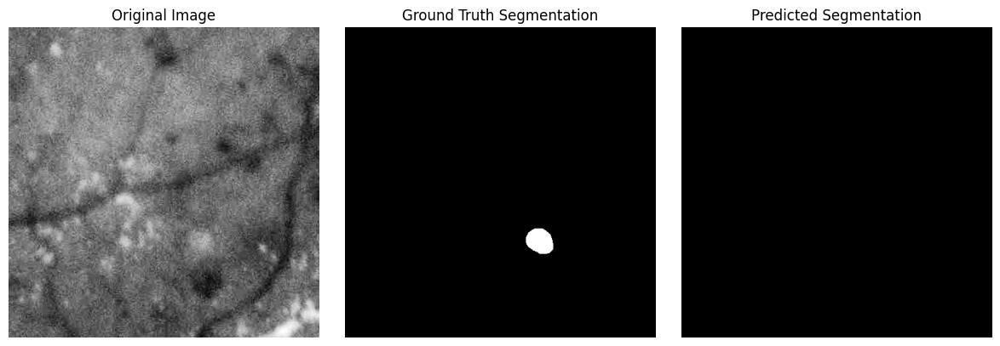

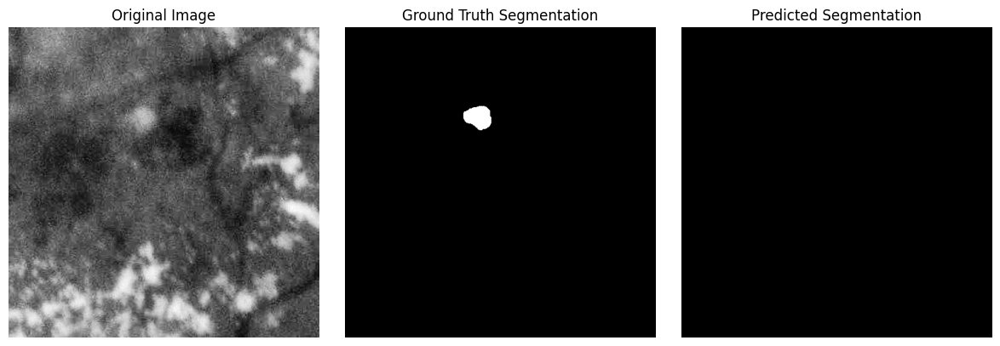

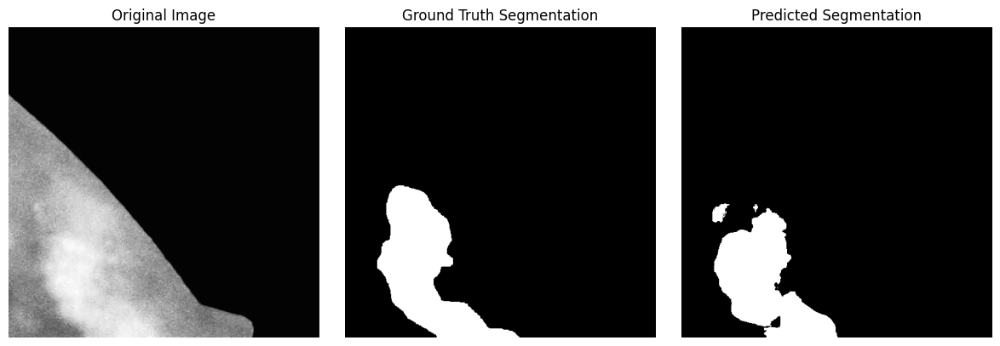

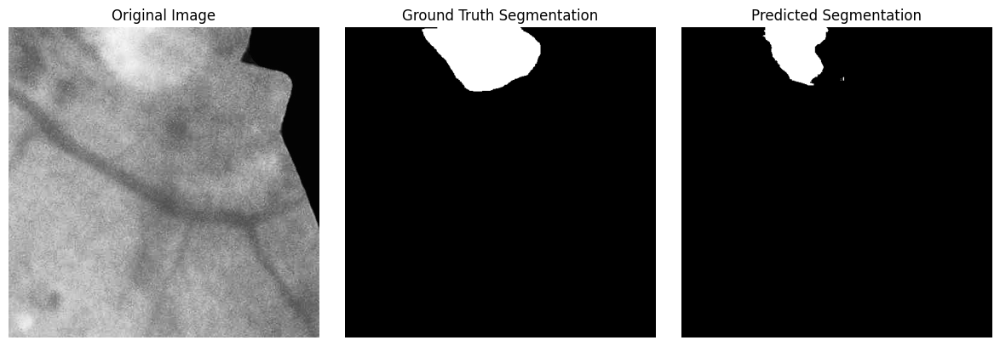

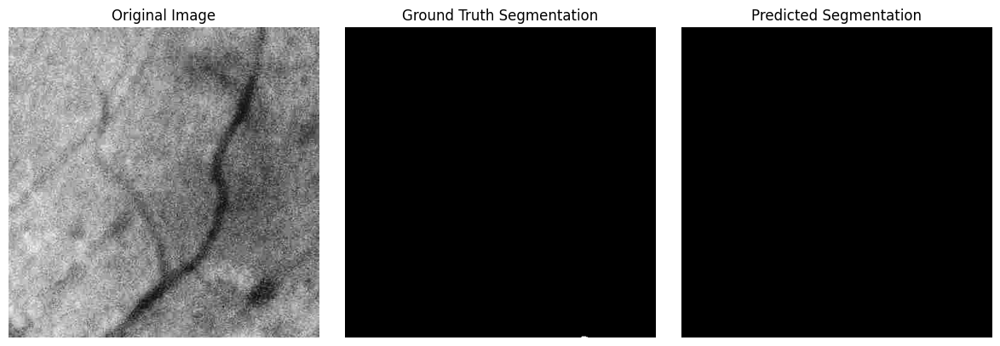

...

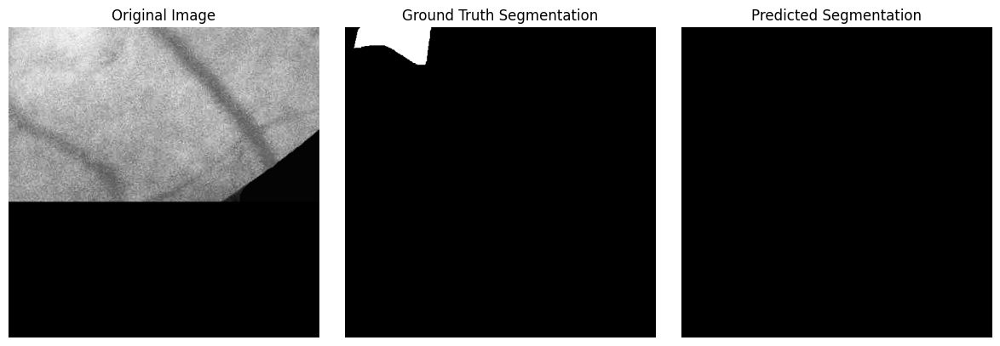

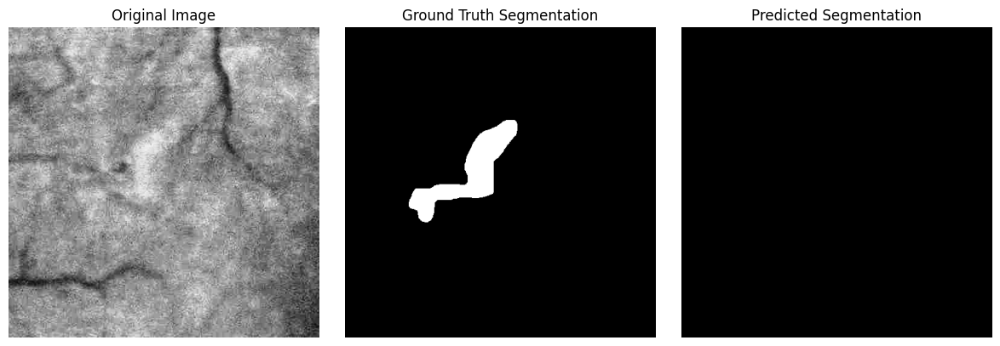

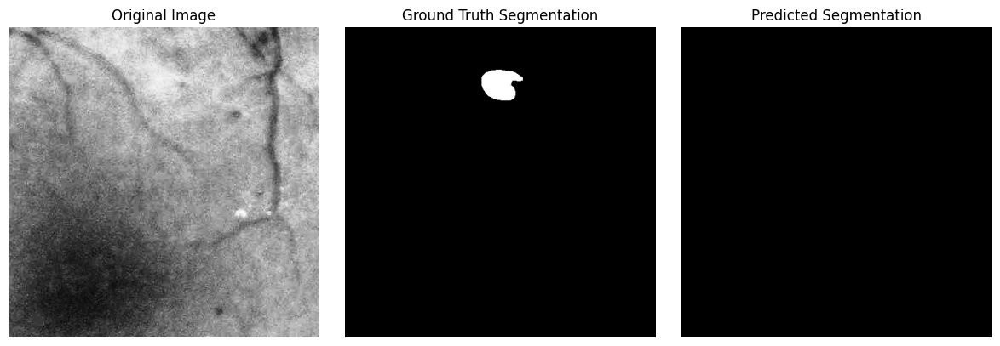

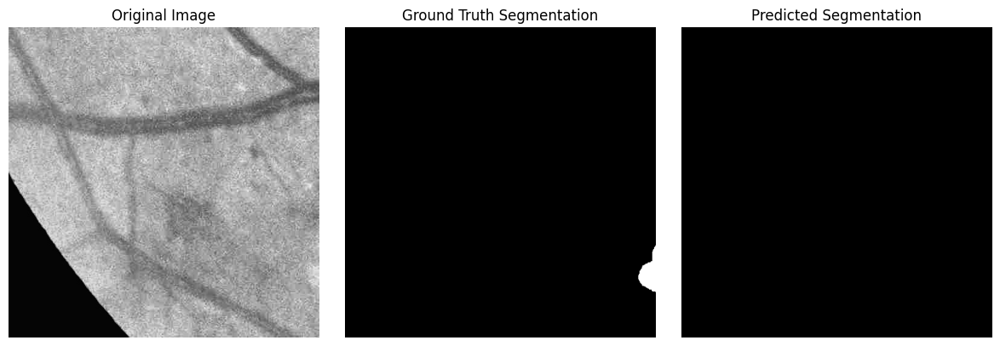

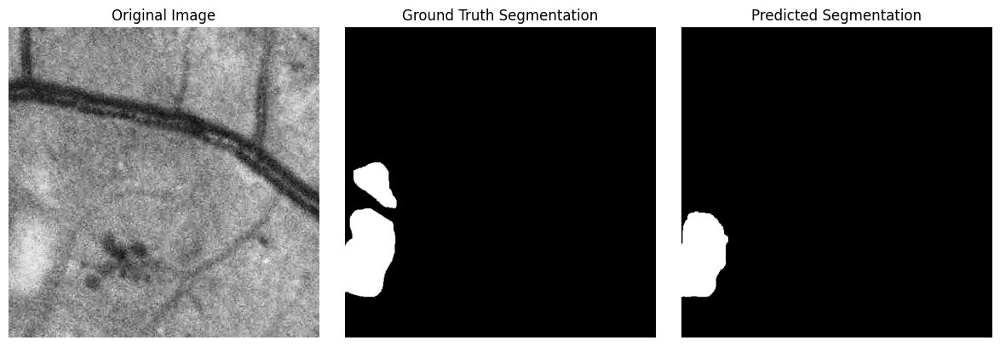

In [58]:

import matplotlib.pyplot as plt
from skimage import io

dataset_path = "/kaggle/input/idrid-soft-exudate/test_data"
test_x, test_y = load_data(dataset_path)
prediction_path = "/kaggle/working/prediction"

# Iterate through each file and plot original image, ground truth, and predicted segmentation
for img_path, mask_path in zip(test_x, test_y):
    # Load original image
    original_image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    # Load ground truth mask
    ground_truth_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
    # Create path for predicted mask
    predicted_mask_path = os.path.join(prediction_path, os.path.basename(mask_path))
    
    # Check if the predicted mask file exists
    if os.path.exists(predicted_mask_path):
        # Load predicted mask
        predicted_mask = io.imread(predicted_mask_path)
        
        # Plot images
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(original_image, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')
        
        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_mask, cmap='gray')
        plt.title("Ground Truth Segmentation")
        plt.axis('off')
        
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask, cmap='gray')
        plt.title("Predicted Segmentation")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"No predicted mask found for {os.path.basename(mask_path)}. Skipping...")
